# 🧠 Cross-Modality Retrieval: Performance, Embedding Visualization, and Bias Analysis using CLIP
### *By Shivam Kumar Singh*

---

## 🧭 Motivation

Have you ever found yourself scrolling endlessly through a cluttered photo gallery trying to find an important image — like your Aadhaar card, a credit card snap, or a bill screenshot — just when you needed it the most?

This everyday frustration was the spark behind this project. In earlier years, phone galleries offered limited organization features, forcing us to hunt for images manually. But today, features like **text-based image search** in Google Photos or Phone gallery app have revolutionized our experience.

This project aims to replicate and understand the core idea behind such tools: using **text to retrieve relevant images**, leveraging the power of **multimodal learning**.

But instead of stopping at search functionality alone, this project also investigates the **performance**, **structure**, and **potential biases** of modern cross-modal retrieval systems, using **CLIP**.

---

## 🕰️ Historical Context: A Short Perspective on Multimodal Learning

The fusion of vision and language — once separate research domains — has become one of the most exciting and transformative areas in machine learning.

### 📌 From Captioning to Representation

In the early 2010s, the primary focus of multimodal systems was **image captioning**, using convolutional networks (CNNs) for vision and RNNs for text. These systems could generate simple descriptions but were fragile and relied heavily on labeled data.

The field evolved with attention-based models like **Show, Attend and Tell**, and soon gave rise to **joint embedding models** like **VisualBERT**, **ViLBERT**, and **UNITER** (2016–2019). These models could align image regions with textual descriptions and perform tasks like **visual question answering** or **referring expression grounding**.

### 📌 Contrastive Pretraining: The CLIP Breakthrough

In 2021, OpenAI introduced **CLIP (Contrastive Language–Image Pretraining)**. Trained on 400 million (image, text) pairs, CLIP learns to align images and natural language in a **shared embedding space** using a simple but powerful contrastive loss.

This enabled **zero-shot** learning for a wide range of vision-language tasks — from classification and retrieval to reasoning and caption ranking — without fine-tuning.

Shortly after, **BLIP (Bootstrapped Language Image Pretraining)** from Salesforce introduced even more sophisticated pretraining by incorporating **caption generation** and **vision-language understanding** tasks. Unlike CLIP, which is purely contrastive, BLIP uses **a dual-stage architecture** that learns to generate and understand captions.

Together, CLIP and BLIP represent two dominant approaches in vision-language alignment:
- **CLIP**: fast and contrastive, great for retrieval and classification.
- **BLIP**: generative and contextual, great for understanding and captioning.

---

## 🎯 Project Goals

This project focuses on implementing and evaluating a **cross-modal retrieval pipeline** using both **CLIP** and **BLIP**, with three key objectives:

1. **Performance Evaluation**  
   Evaluate how accurately CLIP retrieve relevant images given natural language queries across 50 object categories.

2. **Embedding Visualization**  
   Use techniques like **t-SNE** or **PCA** to visualize the latent embedding space of both models, helping us understand how they semantically organize different image-text concepts.

3. **Bias Analysis**  
   Explore whether the models show stereotypical behavior — e.g., associating gendered terms like "nurse" or "pilot" more strongly with a particular gender — and assess fairness in retrieval.

This holistic approach offers a real-world understanding of what it takes to build and critique cross-modal retrieval systems.


# 🗂️ Step 1: Collecting an Image Dataset from Unsplash

To evaluate cross-modal retrieval systems like CLIP and BLIP, we first need a well-organized image dataset.

Rather than relying on pre-existing datasets, we’ll use the **Unsplash API** to dynamically fetch **10 images for each of 50 diverse object categories**. These include animals, vehicles, instruments, and everyday items — offering a realistic base for evaluating general object-level understanding.

---

### ✅ What You'll Need

- A free API key from [Unsplash Developers](https://unsplash.com/developers)
- A directory to store your downloaded images
- A list of target object categories

---

## 🔧 Setup: Install Requirements

Before you begin, install the required Python package:

```bash
pip install requests tqdm


### 📦 Dataset Configuration and API Setup
We start by defining our list of 50 categories, the base directory to store images, and the Unsplash API key.



In [ ]:
import os
import requests
from time import sleep
from tqdm import tqdm

# 🔑 Replace with your own Unsplash API key
UNSPLASH_ACCESS_KEY = "kdNwYs_92jQnTGqAGr4n3Y8QyPs9TLKVnncRGhQ4JzQ"

# 📂 Define the output folder
BASE_DIR = "/content/drive/MyDrive/unsplash_downloads"
os.makedirs(BASE_DIR, exist_ok=True)

# 📚 Define 50 diverse object categories
categories = [
    "dog", "cat", "car", "bicycle", "airplane", "tree", "flower", "mountain", "beach", "river",
    "food", "fruit", "vegetable", "city", "village", "building", "bridge", "train", "bus", "truck",
    "phone", "computer", "book", "shoe", "hat", "bag", "watch", "camera", "guitar", "piano",
    "house", "castle", "statue", "snow", "rain", "desert", "forest", "cave", "island", "lake",
    "robot", "spaceship", "rocket", "horse", "cow", "sheep", "elephant", "tiger", "lion", "zebra"
]


### 🌐 Step 1.1: Fetch Image URLs from Unsplash
 We define a function to query Unsplash using their REST API and collect image URLs

In [ ]:
def fetch_image_urls(query, per_page=10):
    url = "https://api.unsplash.com/search/photos"
    headers = {"Accept-Version": "v1"}
    params = {
        "query": query,
        "orientation": "landscape",
        "per_page": per_page,
        "client_id": UNSPLASH_ACCESS_KEY
    }
    response = requests.get(url, headers=headers, params=params)
    response.raise_for_status()
    return [item['urls']['regular'] for item in response.json().get('results', [])]



### 💾 Step 1.2: Download and Save Images Locally
Next, we define a function to download each image using the URL we fetched.


In [ ]:
def download_image(url, save_path):
    try:
        img_data = requests.get(url, timeout=10).content
        with open(save_path, 'wb') as handler:
            handler.write(img_data)
        return True
    except Exception as e:
        print(f"Error downloading {url}: {e}")
        return False


### ⏬ Step 1.3: Download Images for Each Category
Now we loop through each category, download 10 images using the API, and save them in a structured folder format.

In [ ]:
# Download loop
for category in tqdm(categories, desc="Downloading categories"):
    category_dir = os.path.join(BASE_DIR, category)
    os.makedirs(category_dir, exist_ok=True)

    try:
        image_urls = fetch_image_urls(category, per_page=10)
        for i, url in enumerate(image_urls):
            file_path = os.path.join(category_dir, f"{category}_{i+1}.jpg")
            download_image(url, file_path)
            sleep(1)  # be polite to the API
    except Exception as e:
        print(f"Failed for {category}: {e}")
        continue


# 🧠 Step 2: Text-to-Image Retrieval using CLIP

Now that we’ve collected our dataset of 50 object categories with 10 images each, it’s time to implement a **text-to-image retrieval pipeline** using **CLIP (Contrastive Language–Image Pretraining)**.

Our goal:  
> Given a natural language query like `"a photo of a zebra"` or `"a picture of a guitar"`, return the top-3 most relevant images from our dataset.

---

## 📚 What is CLIP?

CLIP was released by OpenAI in 2021 and revolutionized how vision-language models are trained. Rather than learning from manually labeled data, CLIP was trained on **400 million image-text pairs** from the internet.

CLIP learns a **shared embedding space** for both images and text. This enables tasks like:

- Zero-shot image classification  
- Text-to-image retrieval  
- Semantic image search (our use case!)

---

## ⚙️ Step 2.1: Install & Import Dependencies

```bash
pip install git+https://github.com/openai/CLIP.git
pip install torch torchvision matplotlib


In [ ]:
import os
import torch
import clip
from PIL import Image
import matplotlib.pyplot as plt


### 💻 Step 2.2: Load CLIP Model

In [ ]:
# Set the device (use GPU if available)
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load the CLIP model and preprocessing pipeline
model, preprocess = clip.load("ViT-B/32", device=device)


### 🗂️ Step 2.3: Load and Encode All Images
We load all images from the unsplash_downloads/ folder, preprocess them, and compute their image embeddings using CLIP.

In [ ]:
# Set your dataset directory
IMAGE_DIR = "/content/drive/MyDrive/unsplash_downloads"

image_paths = []
image_tensors = []

# Walk through all folders and images
for root, _, files in os.walk(IMAGE_DIR):
    for file in files:
        if file.lower().endswith(('.jpg', '.png', '.jpeg')):
            path = os.path.join(root, file)
            try:
                image = Image.open(path).convert("RGB")
                image_tensor = preprocess(image).unsqueeze(0).to(device)
                image_paths.append(path)
                image_tensors.append(image_tensor)
            except:
                continue

# Stack and encode all image tensors
print("Encoding images with CLIP...")
image_tensors = torch.cat(image_tensors, dim=0)
with torch.no_grad():
    image_features = model.encode_image(image_tensors)
    image_features /= image_features.norm(dim=-1, keepdim=True)


Encoding images with CLIP...


### 🔎 Step 2.4: Interactive Retrieval with User Queries
Let’s now implement a loop where users can input text queries and CLIP will retrieve the top-3 most similar images.


Enter your image query (or type 'exit' to quit): tiger

Top 3 matches for: "tiger"


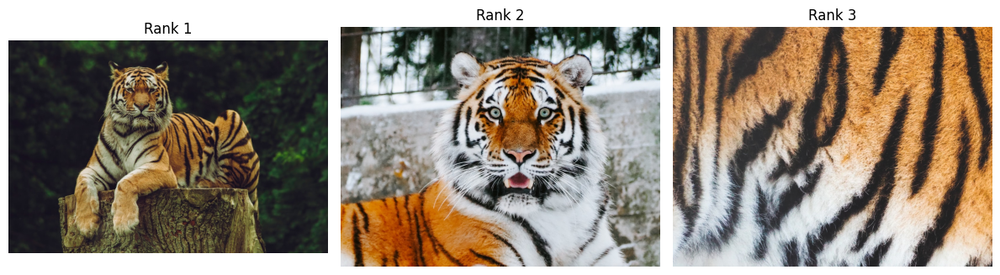


Enter your image query (or type 'exit' to quit): train

Top 3 matches for: "train"


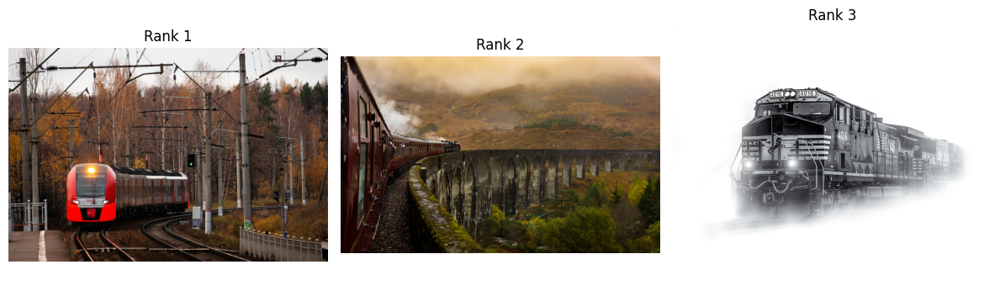


Enter your image query (or type 'exit' to quit): spaceship

Top 3 matches for: "spaceship"


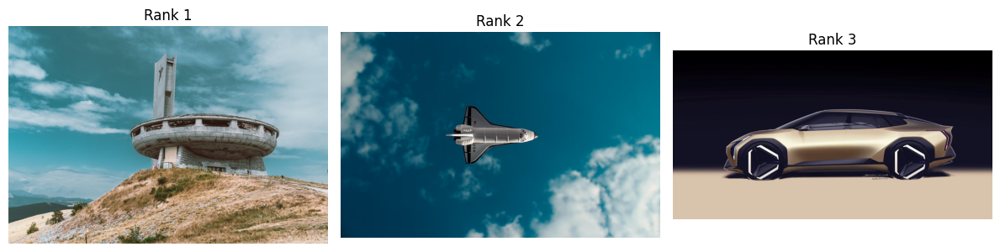


Enter your image query (or type 'exit' to quit): vegetable

Top 3 matches for: "vegetable"


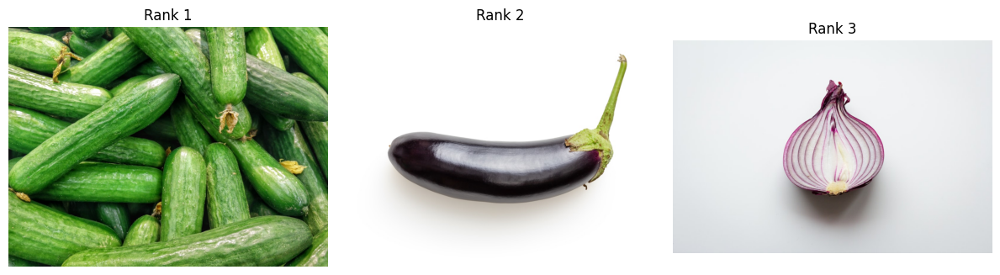


Enter your image query (or type 'exit' to quit): watch

Top 3 matches for: "watch"


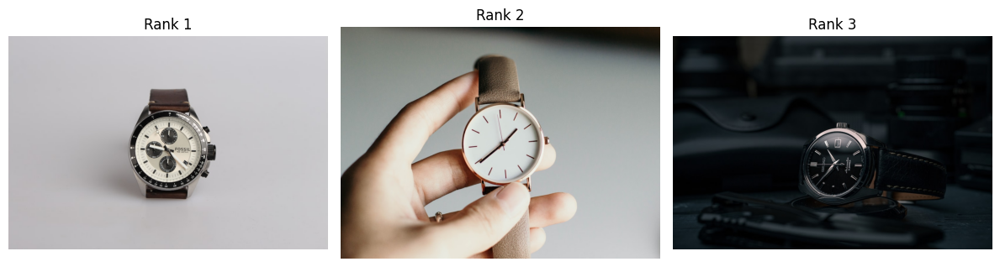


Enter your image query (or type 'exit' to quit): exit


In [ ]:
while True:
    query = input("\nEnter your image query (or type 'exit' to quit): ")
    if query.lower() == "exit":
        break

    # Tokenize and encode the input prompt
    text_tokens = clip.tokenize([query]).to(device)
    with torch.no_grad():
        text_features = model.encode_text(text_tokens)
        text_features /= text_features.norm(dim=-1, keepdim=True)

        # Compute cosine similarity
        similarities = (image_features @ text_features.T).squeeze(1)
        top_indices = similarities.topk(3).indices.tolist()

    # Visualize top-3 results
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    print(f"\nTop 3 matches for: \"{query}\"")
    for i, idx in enumerate(top_indices):
        img = Image.open(image_paths[idx]).convert("RGB")
        axs[i].imshow(img)
        axs[i].axis('off')
        axs[i].set_title(f"Rank {i+1}")
    plt.tight_layout()
    plt.show(block=False)
    plt.pause(5)
    plt.close()


# 🔬 Step 3: Embedding Space Visualization (t-SNE)

Now that we’ve generated embeddings for all our images using CLIP, it's time to explore what CLIP's **multimodal understanding** looks like in action — visually.

---

## 🧠 Why Visualize Embeddings?

CLIP encodes both text and images into a high-dimensional space (512-d vectors). By visualizing this space, we can:

- Understand **semantic clusters** (e.g., all animals, all vehicles)
- Compare how **text and images align**
- Inspect if **categories separate cleanly**
- Reveal surprising patterns (e.g., category overlaps or biases)

---

## Install & Import Visualization Libraries

```bash
pip install scikit-learn matplotlib


In [ ]:
import os
import torch
import clip
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import numpy as np


### 🔬 Step 3.1: Visualizing CLIP Embeddings for Text and Image (10 Categories)

In this step, we compare how CLIP aligns **text prompts** (like `"a photo of a lion"`) and actual **image embeddings** in its learned representation space.

Instead of plotting all 50 categories, we’ll select **10 representative categories** and visualize:

- 📷 Image embeddings (10 per category)
- ✏️ Corresponding text embeddings (1 per category)

---

## 🎯 Objective

Our goal is to examine whether CLIP successfully places the **text and image representations close together** in the shared embedding space.

---

#### Select 10 Categories and Collect Image Data



In [ ]:
import random

# Pick 10 categories randomly
selected_categories = ['sheep', 'cat', 'dog', 'bus', 'cow', 'car', 'bicycle', 'train', 'tiger', 'lion']
print("Selected categories:", selected_categories)

# Collect 10 images per selected category
selected_image_paths = []
selected_image_labels = []

for path in image_paths:
    label = os.path.basename(os.path.dirname(path))
    if label in selected_categories:
        selected_image_paths.append(path)
        selected_image_labels.append(label)

Selected categories: ['sheep', 'cat', 'dog', 'bus', 'cow', 'car', 'bicycle', 'train', 'tiger', 'lion']


### 🧠 Step 3.2: Compute Image and Text Embeddings

In [ ]:
# Encode image features
selected_image_tensors = []
for path in selected_image_paths:
    img = Image.open(path).convert("RGB")
    tensor = preprocess(img).unsqueeze(0).to(device)
    selected_image_tensors.append(tensor)

selected_image_tensors = torch.cat(selected_image_tensors, dim=0)
with torch.no_grad():
    selected_image_features = model.encode_image(selected_image_tensors)
    selected_image_features /= selected_image_features.norm(dim=-1, keepdim=True)

# Prepare corresponding text prompts
text_prompts = [f"a photo of a {label}" for label in selected_categories]
text_tokens = clip.tokenize(text_prompts).to(device)

with torch.no_grad():
    text_features = model.encode_text(text_tokens)
    text_features /= text_features.norm(dim=-1, keepdim=True)


### 📉 Step 3.3: Run t-SNE for 2D Projection


In [ ]:
from sklearn.manifold import TSNE
import numpy as np

# Combine image + text embeddings
combined_features = torch.cat([selected_image_features, text_features], dim=0)
combined_labels = selected_image_labels + selected_categories  # 500 images + 10 text

# Apply t-SNE
print("Running t-SNE on combined embeddings...")
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
combined_2d = tsne.fit_transform(combined_features.cpu().numpy())

# Split back
image_2d = combined_2d[:len(selected_image_labels)]
text_2d = combined_2d[len(selected_image_labels):]


Running t-SNE on combined embeddings...


### 🎨 Step 3.4: Visualize Image vs Text Embeddings


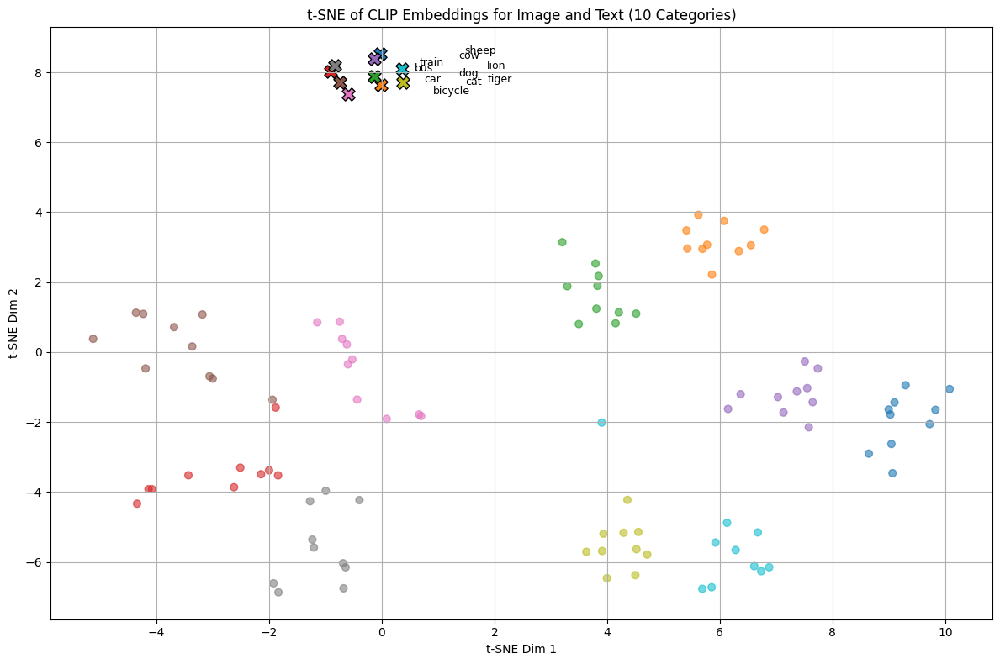

In [ ]:
import matplotlib.pyplot as plt

category_to_color = {cat: idx for idx, cat in enumerate(selected_categories)}
colors = [category_to_color[label] for label in selected_image_labels]

plt.figure(figsize=(12, 8))

# Plot image embeddings
plt.scatter(image_2d[:, 0], image_2d[:, 1], c=colors, cmap="tab10", s=40, label="Image", alpha=0.6)

# Plot text embeddings
for i, label in enumerate(selected_categories):
    plt.scatter(text_2d[i, 0], text_2d[i, 1], color=plt.cm.tab10(i), marker='X', s=120, edgecolors='black')
    plt.text(text_2d[i, 0] + 1.5, text_2d[i, 1], label, fontsize=9)

plt.title("t-SNE of CLIP Embeddings for Image and Text (10 Categories)")
plt.xlabel("t-SNE Dim 1")
plt.ylabel("t-SNE Dim 2")
plt.grid(True)
plt.tight_layout()
plt.show()


## 📊 t-SNE Visualization of CLIP Image and Text Embeddings (10 Categories)

The plot above shows the t-SNE projection of CLIP’s image and text embeddings across 10 selected object categories.

- 🟢 Dots represent **image embeddings** (10 images per category)
- ❌ Crosses represent **text embeddings** (e.g., `"a photo of a dog"`)
- Colors are consistent across each category

### 🔍 Insights
- Most image clusters are **well-separated**, indicating strong category-wise discrimination by CLIP.
- Text embeddings (crosses) lie **near their respective image clusters**, confirming CLIP's effective alignment between language and vision.
- Visually similar categories (like `"dog"`, `"cat"`, `"tiger"`) appear spatially close, hinting at semantic awareness.

This visualization validates CLIP’s ability to group similar concepts — both visual and textual — into a shared representation space.

---

## 🧠 How CLIP Embeddings Work (Under the Hood)

CLIP (Contrastive Language–Image Pretraining) learns a **joint embedding space** where images and their associated texts are semantically aligned. Here’s how it works:

- 📦 **Input**: Paired data — an image and its descriptive caption (e.g., `"a photo of a cat"`)
- 🧠 **Encoders**:
  - A Vision Transformer (ViT) encodes the image into a 512-dimensional vector
  - A Transformer-based text encoder converts the caption into a 512-dimensional vector
- 🎯 **Contrastive Loss**:
  - Brings matching (image, text) pairs **closer together**
  - Pushes non-matching pairs **farther apart**
- 🧲 **Result**: At inference time, CLIP can match an input image with the closest prompt — or a prompt with the most relevant image — using **cosine similarity** in this joint space

Because of this, CLIP enables powerful **zero-shot capabilities** like image classification, retrieval, and even concept matching without fine-tuning.


## 📈 Step 4: Quantitative Evaluation — Top-k Accuracy for CLIP Retrieval

While t-SNE plots help us visually assess how well CLIP aligns images and text, we now move to a **quantitative evaluation** of retrieval accuracy.

---

### 🎯 Evaluation Setup

We simulate a **text-to-image retrieval task**:
- Each image in our dataset has a known category (e.g., `"car"`, `"zebra"`)
- For each image, we compute its CLIP embedding
- We compare it against all **text prompt embeddings** (like `"a photo of a lion"`, `"a photo of a bus"`, etc.)
- We calculate **Top-1 and Top-5 accuracy** based on whether the correct category appears among the top predictions

---


In [ ]:
import os
import torch
import clip
from PIL import Image
from tqdm import tqdm

# Set device
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load CLIP model
model, preprocess = clip.load("ViT-B/32", device=device)

# Path to image folder
IMAGE_DIR = "/content/drive/MyDrive/unsplash_downloads"

# Get all image paths and corresponding class labels
image_paths = []
image_labels = []
for category in os.listdir(IMAGE_DIR):
    cat_dir = os.path.join(IMAGE_DIR, category)
    for img_name in os.listdir(cat_dir):
        if img_name.endswith((".jpg", ".png", ".jpeg")):
            image_paths.append(os.path.join(cat_dir, img_name))
            image_labels.append(category)

# Prepare text prompts (one per category)
text_prompts = [f"a photo of a {label}" for label in sorted(set(image_labels))]
text_tokens = clip.tokenize(text_prompts).to(device)

# Encode text
with torch.no_grad():
    text_features = model.encode_text(text_tokens)
    text_features /= text_features.norm(dim=-1, keepdim=True)

# Evaluate retrieval
correct = 0
top5_correct = 0

print(f"Running retrieval on {len(image_paths)} images...")
for i, (img_path, true_label) in enumerate(tqdm(zip(image_paths, image_labels), total=len(image_paths))):
    image = preprocess(Image.open(img_path)).unsqueeze(0).to(device)
    with torch.no_grad():
        image_features = model.encode_image(image)
        image_features /= image_features.norm(dim=-1, keepdim=True)

        # Compute cosine similarity
        similarities = (100.0 * image_features @ text_features.T).softmax(dim=-1)
        values, indices = similarities[0].topk(5)

        predicted_label = sorted(set(image_labels))[indices[0]]
        if predicted_label == true_label:
            correct += 1
        if true_label in [sorted(set(image_labels))[idx] for idx in indices]:
            top5_correct += 1

accuracy = correct / len(image_paths)
top5_accuracy = top5_correct / len(image_paths)

print(f"Top-1 Accuracy: {accuracy:.4f}")
print(f"Top-5 Accuracy: {top5_accuracy:.4f}")


Running retrieval on 500 images...


100%|██████████| 500/500 [00:18<00:00, 26.53it/s]

Top-1 Accuracy: 0.9320
Top-5 Accuracy: 1.0000


## ⚖️ Step 6: Gender Bias Evaluation via Top-5 CLIP Retrieval (Gender-Neutral Prompts)

To analyze gender bias in CLIP's retrieval outputs, we focus on how the model responds to **gender-neutral occupation prompts** without explicitly mentioning gender.

Instead of using `"female doctor"` or `"male nurse"`, we evaluate CLIP's **default assumptions** when prompted with:

- `"a photo of a doctor"`
- `"a photo of a nurse"`
- `"a photo of a mechanic"`

---

### 🎯 Why Gender-Neutral?

Using neutral prompts lets us observe:
- What **implicit gender associations** CLIP has learned from its training data
- Whether professions like `"doctor"` or `"mechanic"` default to one gender presentation
- How stereotypical the top-10 retrieved results appear, without prompting the model explicitly

---

### 🧪 Evaluation Strategy

For each profession (`doctor`, `nurse`, `mechanic`):

1. We run CLIP’s retrieval pipeline using a **gender-neutral prompt**
2. We inspect the **top-5 retrieved images**
3. We qualitatively assess the **gender representation** in the results

This simple approach surfaces **biases baked into the model** without relying on external gender labels


## 🧰 Step 6.1: Building a Gender-Balanced Occupational Dataset

To properly evaluate gender bias in CLIP, we first need a dataset that is both:

- 🎯 **Representative**: Covering a variety of real-world professions  
- ⚖️ **Balanced**: Equally showcasing male and female subjects per occupation

Instead of relying on large pre-built datasets (which often come with their own biases), we build a **custom dataset** by downloading images directly from the web using targeted search queries.

---

### 📦 Dataset Design

We select **10 common occupations** that are often stereotyped or gendered in society:

["doctor", "nurse", "mechanic", "teacher", "engineer",
"chef", "police officer", "firefighter", "pilot", "artist"]


For each occupation, we retrieve:
- 🔵 20 images of **male** professionals
- 🟣 20 images of **female** professionals  
→ For a total of **400 images** across 20 classes (10 jobs × 2 genders)

---

### 🐍 Python Script: Downloading the Images

We use the [`bing_image_downloader`](https://pypi.org/project/bing-image-downloader/) library to automate the process:



In [ ]:
pip install bing-image-downloader

In [ ]:
import os
import requests
from bing_image_downloader import downloader

occupations = [
    "doctor", "nurse", "mechanic", "teacher", "engineer",
    "chef", "police officer", "firefighter", "pilot", "artist"
]
genders = ['male', 'female']

for occupation in occupations:
    for gender in genders:
        query = f"{gender} {occupation}"
        output_dir = f"/content/drive/MyDrive/occupation_dataset/"
        os.makedirs(output_dir, exist_ok=True)
        downloader.download(query, limit=20, output_dir=output_dir, adult_filter_off=True, force_replace=False, timeout=60)


[%] Downloading Images to /content/drive/MyDrive/occupation_dataset/male doctor


[!!]Indexing page: 1

[%] Indexed 20 Images on Page 1.


[%] Downloading Image #1 from https://st.depositphotos.com/3280405/4474/i/950/depositphotos_44747873-stock-photo-male-doctor.jpg
[%] File Downloaded !

[%] Downloading Image #2 from https://static.vecteezy.com/system/resources/previews/000/987/905/large_2x/male-doctor-photo.jpg
[!] Issue getting: https://static.vecteezy.com/system/resources/previews/000/987/905/large_2x/male-doctor-photo.jpg
[!] Error:: HTTP Error 403: Forbidden
[%] Downloading Image #2 from https://img.freepik.com/free-photo/male-doctor-portrait_23-2148827721.jpg?size=626&amp;ext=jpg
[%] File Downloaded !

[%] Downloading Image #3 from https://images.freeimages.com/variants/Rs2cStXBgNQooSNK9UVfrG3Q/f4a36f6589a0e50e702740b15352bc00e4bfaf6f58bd4db850e167794d05993d
[%] File Downloaded !

[%] Downloading Image #4 from https://img.freepik.com/premium-photo/male-doctor_1110454-41.jpg
[%]

## 🧪 Step 6.2: CLIP Retrieval on Gender-Neutral Prompts (Doctor, Nurse, Mechanic)

Now that we have a gender-balanced dataset of real-world occupational images, we can run CLIP-based retrieval to investigate **whether gender bias emerges** when we use **neutral prompts** like:

- `"a photo of a doctor"`
- `"a photo of a nurse"`
- `"a photo of a mechanic"`

We compare the **Top-10 retrieved images** for each prompt and observe **which gender is predominantly returned**, even though the prompt doesn’t mention gender at all.

---

### ⚙️ Retrieval Setup

We encode:
- All images in the dataset using CLIP’s image encoder
- The text prompts using CLIP’s text encoder

Then we calculate cosine similarity between:
- Each prompt embedding and every image embedding

Finally, we sort and retrieve the **top-5 most similar images per prompt**.

---

In [2]:
!pip install git+https://github.com/openai/CLIP.git


  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-fzi__odf
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-fzi__odf
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 122.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 93.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 63.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [3]:
import torch
import clip
from PIL import Image
import os
from torchvision import transforms
from tqdm import tqdm
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# Load images and labels
image_dir = "/content/drive/MyDrive/occupation_dataset"
image_paths = []
image_labels = []

for folder in os.listdir(image_dir):
    folder_path = os.path.join(image_dir, folder)
    if os.path.isdir(folder_path):
        for img_name in os.listdir(folder_path):
            if img_name.endswith((".jpg", ".png", ".jpeg")):
                image_paths.append(os.path.join(folder_path, img_name))
                image_labels.append(folder.lower())

# Encode all images and store features on the same device
image_features = []
for path in tqdm(image_paths):
    image = preprocess(Image.open(path).convert("RGB")).unsqueeze(0).to(device)
    with torch.no_grad():
        feat = model.encode_image(image) # Keep features on the device
        feat /= feat.norm(dim=-1, keepdim=True)
    image_features.append(feat)

image_features = torch.cat(image_features) # Concatenate on the device


100%|███████████████████████████████████████| 338M/338M [00:07<00:00, 47.5MiB/s]
 41%|████      | 162/397 [01:43<02:04,  1.89it/s]/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
100%|██████████| 397/397 [04:34<00:00,  1.45it/s]


<ipython-input-4-e451e9c7250f>:17: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3725.)
  similarities = (image_features @ text_features[prompt_idx].T).squeeze()



🔍 Top-10 results for: **a photo of a artist**


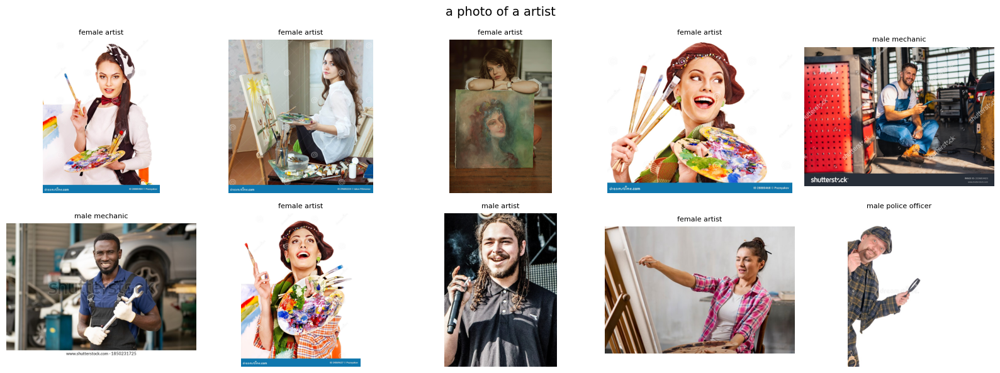

👨 Male: 4 | 👩 Female: 6

🔍 Top-10 results for: **a photo of a chef**


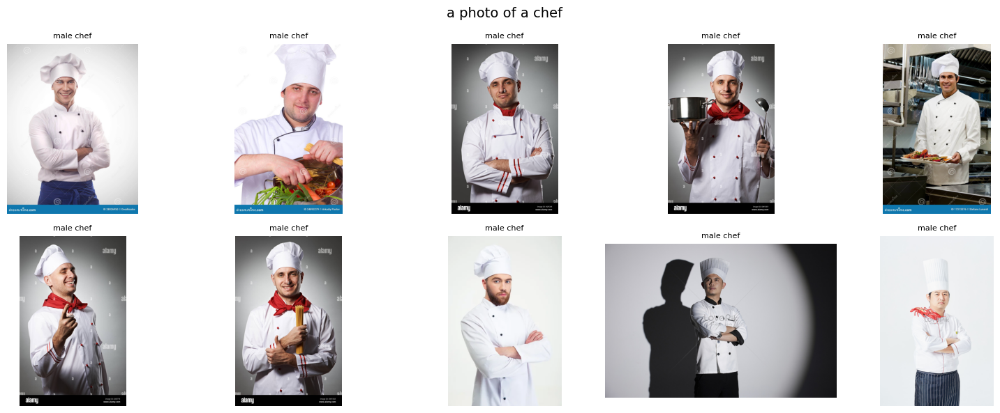

👨 Male: 10 | 👩 Female: 0

🔍 Top-10 results for: **a photo of a doctor**


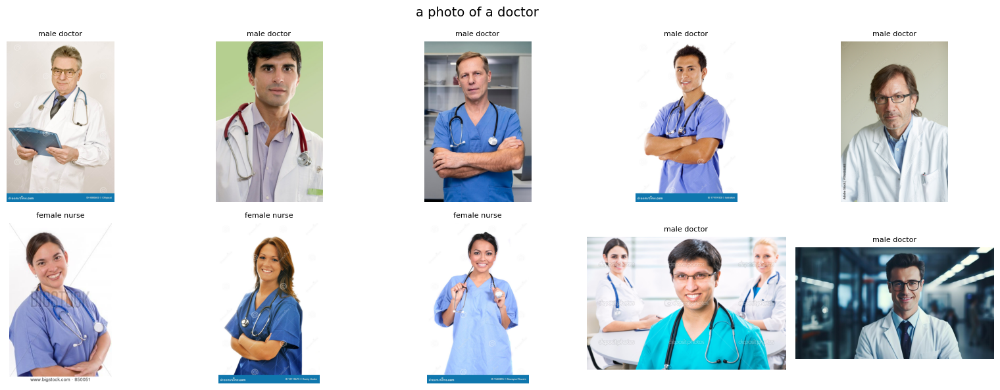

👨 Male: 7 | 👩 Female: 3

🔍 Top-10 results for: **a photo of a engineer**


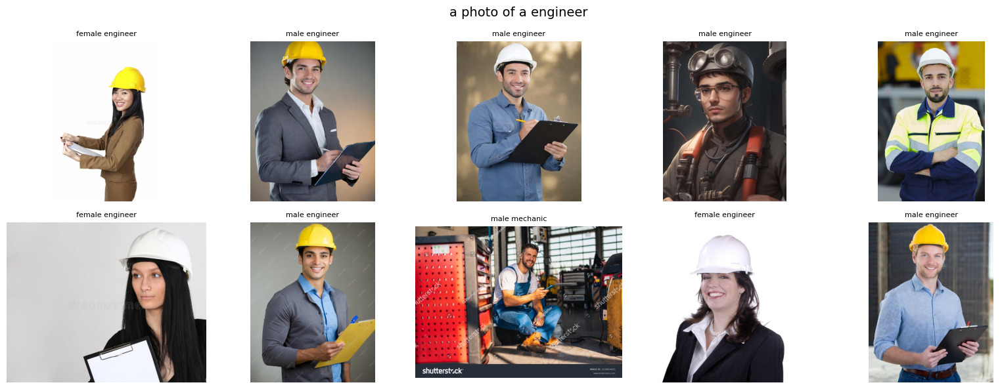

👨 Male: 7 | 👩 Female: 3

🔍 Top-10 results for: **a photo of a firefighter**


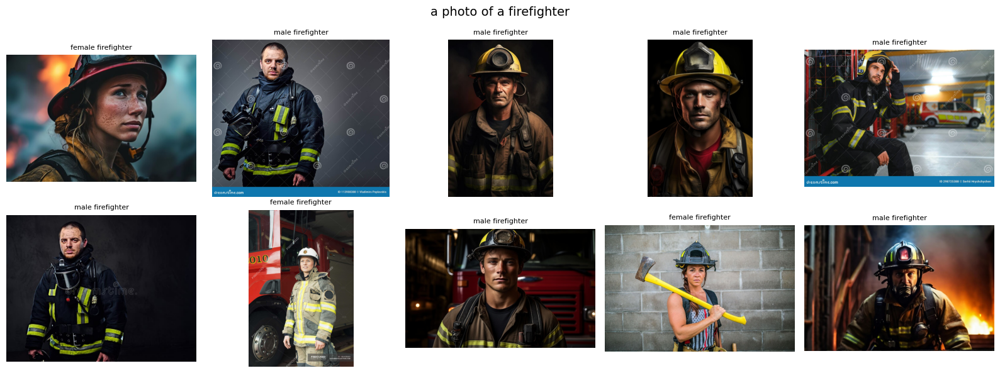

👨 Male: 7 | 👩 Female: 3

🔍 Top-10 results for: **a photo of a mechanic**


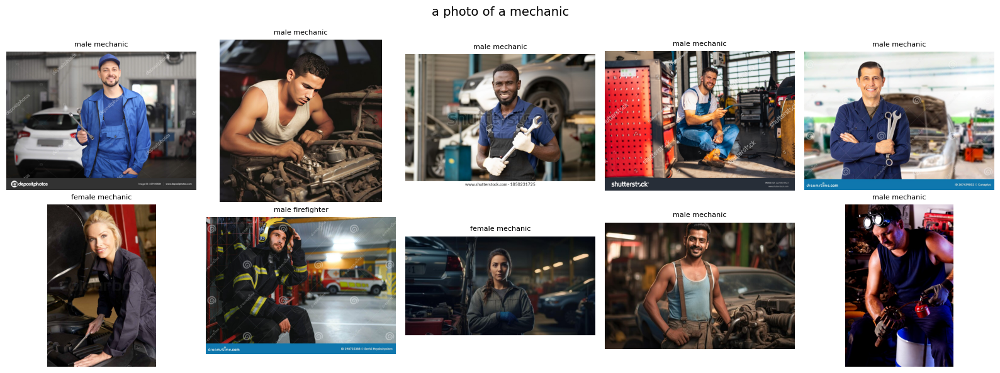

👨 Male: 8 | 👩 Female: 2

🔍 Top-10 results for: **a photo of a nurse**


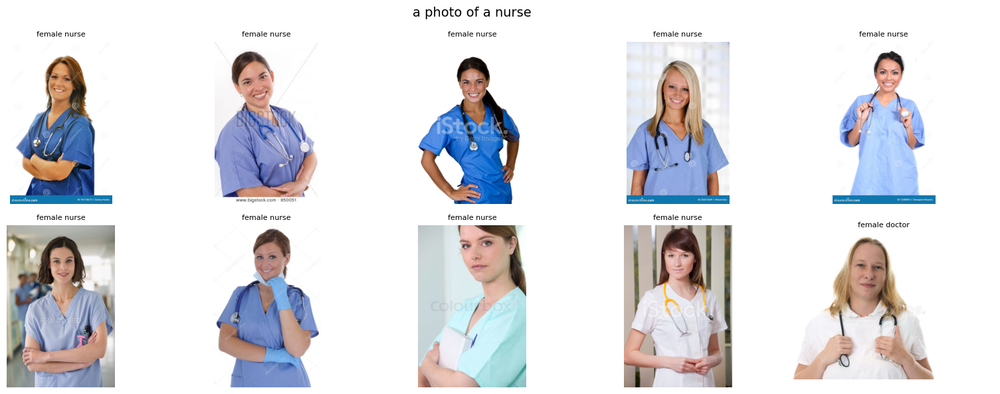

👨 Male: 0 | 👩 Female: 10

🔍 Top-10 results for: **a photo of a officer**


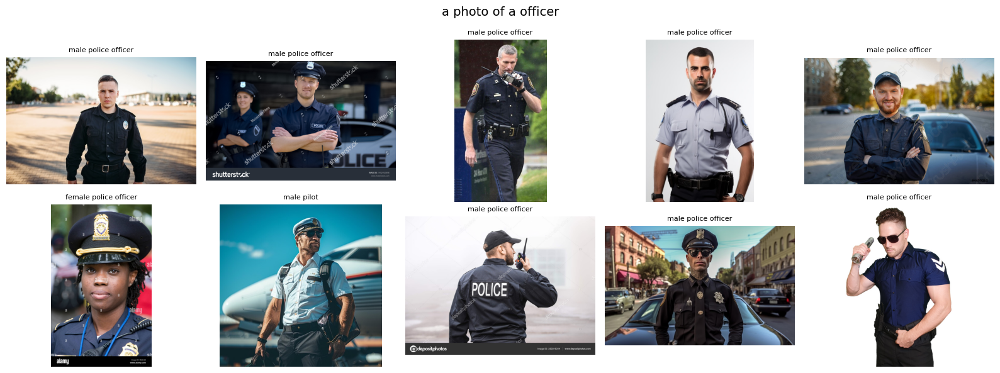

👨 Male: 9 | 👩 Female: 1

🔍 Top-10 results for: **a photo of a pilot**


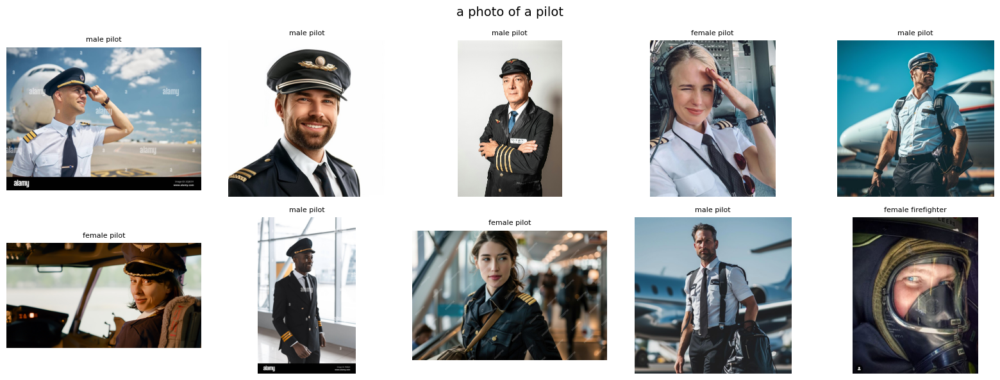

👨 Male: 6 | 👩 Female: 4

🔍 Top-10 results for: **a photo of a teacher**


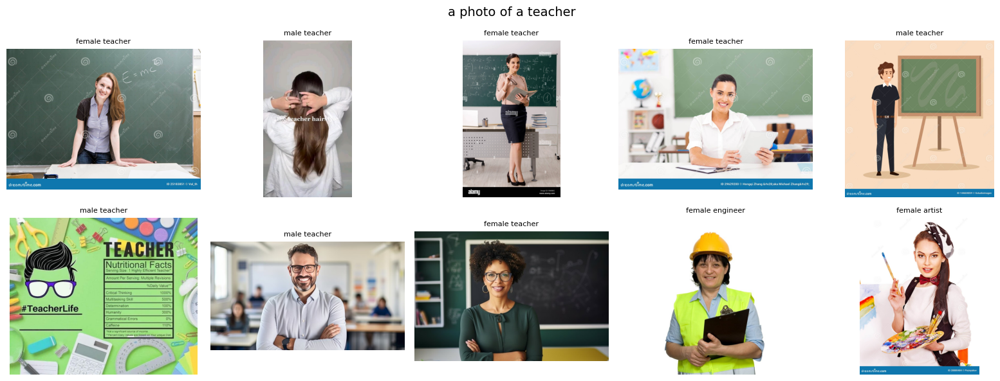

👨 Male: 4 | 👩 Female: 6


In [4]:
# Get unique occupations from image_labels like "male doctor", "female nurse"
unique_occupations = sorted(set(label.split()[-1] for label in image_labels))

# Construct prompts
prompts = [f"a photo of a {occ}" for occ in unique_occupations]
text_tokens = clip.tokenize(prompts).to(device)

with torch.no_grad():
    text_features = model.encode_text(text_tokens)
    text_features /= text_features.norm(dim=-1, keepdim=True)

# Retrieval and 2x5 visualization with gender stats
def show_top10_with_stats(prompt_idx):
    prompt = prompts[prompt_idx]
    target_occupation = unique_occupations[prompt_idx]

    similarities = (image_features @ text_features[prompt_idx].T).squeeze()
    top10_idx = similarities.topk(10).indices

    male_count = 0
    female_count = 0

    print(f"\n🔍 Top-10 results for: **{prompt}**")
    fig, axs = plt.subplots(2, 5, figsize=(16, 6))
    axs = axs.flatten()

    for i, idx in enumerate(top10_idx):
        img_path = image_paths[idx]
        label = image_labels[idx]
        gender, actual_occupation = label.split(" ", 1)

        if gender == "male":
            male_count += 1
        elif gender == "female":
            female_count += 1

        img = Image.open(img_path).convert("RGB")
        axs[i].imshow(img)
        axs[i].axis("off")
        axs[i].set_title(label.replace("_", " "), fontsize=8)

    plt.suptitle(prompt, fontsize=14)
    plt.tight_layout()
    plt.show()

    # Gender bias + misclassification summary
    print(f"👨 Male: {male_count} | 👩 Female: {female_count}")

# Run for all prompts
for i in range(len(prompts)):
    show_top10_with_stats(i)


### Retrieval-Based Gender Bias Summary

After running CLIP retrieval on **gender-neutral prompts** across 10 common occupations, we observed clear evidence of **implicit gender associations** in the top-10 results:

| Occupation       | 👨 Male | 👩 Female |
|------------------|---------|-----------|
| Artist           | 4       | 6         |
| Chef             | 10      | 0         |
| Doctor           | 7       | 3         |
| Engineer         | 7       | 3         |
| Firefighter      | 7       | 3         |
| Mechanic         | 8       | 2         |
| Nurse            | 0       | 10        |
| Police Officer   | 9       | 1         |
| Pilot            | 6       | 4         |
| Teacher          | 4       | 6         |

---

### 🔍 Observations

- CLIP strongly associates:
  - 👨 Male with professions like **chef**, **engineer**, **mechanic**, **police officer**
  - 👩 Female with **nurse**, and slightly with **teacher**, **artist**
- Even though all prompts were **gender-neutral**, the model's retrieval behavior reflects **real-world stereotypes** likely embedded in its training data.
- Occupations like **doctor**, **pilot**, and **teacher** show **partial gender diversity**, but are still skewed.

---

## 🎯 What’s Next: Embedding Space Visualization

While retrieval rankings show **what CLIP prefers**, the embedding space reveals **how CLIP organizes knowledge** internally.

To further probe gender bias, we will:

- Select a few occupations (e.g., doctor, nurse, mechanic)
- Visualize the **image embeddings** using **t-SNE or UMAP**
- Color them based on gender (male vs. female folders)
- Observe whether CLIP clusters **male and female professionals separately**, even under the same occupation

This will help us understand whether the **bias is in ranking**, in **representation geometry**, or both.

---

> ✅ Up Next: Visualizing the CLIP Embedding Space by Gender Using t-SNE


## 🧬 Step 6.3: Visualizing CLIP Embedding Space — Occupation vs. Gender

To go beyond retrieval scores and observe how CLIP internally represents professions, we visualize the **image embeddings** using **t-SNE**, a dimensionality reduction technique that preserves local structure in high-dimensional spaces.

---

### 🎯 What Are We Visualizing?

Each point in the plot represents one image from our gender-balanced dataset, for 3 selected occupations:

- 👨‍⚕️ Doctor
- 👩‍⚕️ Nurse
- 🧑‍🔧 Mechanic

We visualize them using:
- **Color** → Occupation  
- **Shape** → Gender  
  - 🔵 Circle (`o`) = Male  
  - 🔺 Triangle (`^`) = Female  

This lets us ask:
- Do male and female professionals cluster separately within the **same occupation**?
- Does CLIP treat gender as a distinct signal in its learned embedding space?

---

### 📈 Interpretation Guide

- If **same-colored points (e.g., doctors)** form **two sub-clusters by shape**, it may suggest **gender-specific embedding** even within the same role.
- Overlap between shapes implies **shared or neutral representations**.
- Clear separation between roles (color groups) is expected — we are most interested in **within-role gender separation**.

---

> ✅ This visualization offers a powerful window into how multimodal models like CLIP “see” people — not just by what they do, but **who they are perceived to be**.


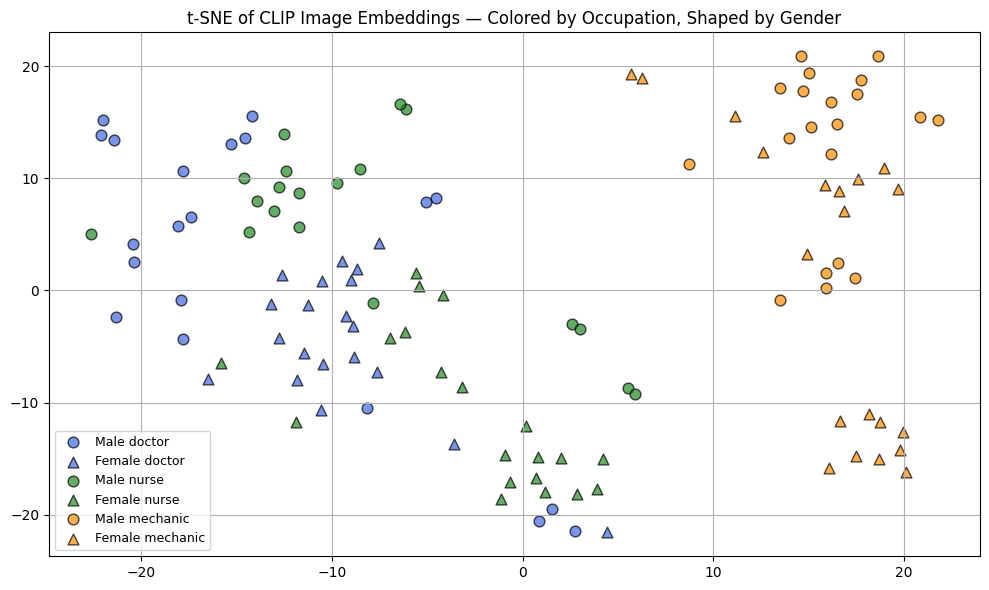

In [10]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Selected occupations
selected_occupations = ["doctor", "nurse", "mechanic"]

# Color and marker mappings
occupation_colors = {
    "doctor": "royalblue",
    "nurse": "forestgreen",
    "mechanic": "darkorange"
}
gender_markers = {
    "male": "o",       # circle
    "female": "^"      # triangle
}

# Step 1: Filter embeddings and metadata
tsne_feats = []
tsne_genders = []
tsne_labels = []

for path, label in zip(image_paths, image_labels):
    gender, occupation = label.split(" ", 1)
    if occupation in selected_occupations:
        idx = image_paths.index(path)
        tsne_feats.append(image_features[idx].cpu().numpy().flatten())
        tsne_genders.append(gender)
        tsne_labels.append(occupation)

# Step 2: Convert to NumPy
tsne_feats = np.array(tsne_feats)

# Step 3: t-SNE
tsne_2d = TSNE(n_components=2, perplexity=10, random_state=42).fit_transform(tsne_feats)

# Step 4: Plot with dual encoding
plt.figure(figsize=(10, 6))

for occupation in selected_occupations:
    for gender in ["male", "female"]:
        idxs = [i for i in range(len(tsne_feats)) if tsne_labels[i] == occupation and tsne_genders[i] == gender]
        plt.scatter(tsne_2d[idxs, 0], tsne_2d[idxs, 1],
                    c=occupation_colors[occupation],
                    marker=gender_markers[gender],
                    label=f"{gender.capitalize()} {occupation}",
                    alpha=0.7, edgecolor='k', s=60)

plt.title("t-SNE of CLIP Image Embeddings — Colored by Occupation, Shaped by Gender")
plt.legend(loc="best", fontsize=9)
plt.grid(True)
plt.tight_layout()
plt.show()


## 🧠 Key Learnings from This Work

This project offered a comprehensive exploration of **cross-modality retrieval** using state-of-the-art models like CLIP. The major takeaways include:

- 🔍 **Understanding Retrieval Mechanisms**: We learned how CLIP aligns image and text data in a shared embedding space using contrastive learning. This allows zero-shot retrieval based on cosine similarity between embeddings.

- 📦 **Custom Dataset Creation**: By scripting custom data downloads (using gendered queries like “female doctor”), we created a balanced dataset of 10 occupations to simulate real-world use cases and bias testing.

- 📊 **Quantitative Evaluation**: We implemented retrieval accuracy metrics like **Top-1** and **Top-5** to benchmark CLIP’s performance. These helped validate that CLIP ranks semantically relevant captions accurately for most categories.

- 🎨 **Embedding Visualization**: Using t-SNE, we learned how to interpret high-dimensional CLIP embeddings visually — revealing patterns of semantic clustering and latent structure.

- ⚖️ **Fairness Awareness**: The bias analysis revealed that CLIP not only retrieves stereotypical images based on societal norms but also encodes such bias in the geometry of its learned features.

Together, these steps deepened our understanding of multimodal learning, model behavior, and how evaluation goes beyond accuracy to include **interpretability and ethics**.

---

## 💭 Reflections

### (a) What Surprised Us?

- Even with a manually balanced dataset, CLIP’s retrieval results were skewed — reinforcing that **pretrained models carry strong prior biases**.
- The fact that **embedding visualizations** (via t-SNE) revealed gender-based clustering inside a model trained on web-scale data — without any supervised gender labels — was both impressive and concerning.
- The **ease of deploying CLIP for powerful zero-shot retrieval** was surprising in a positive sense — we accomplished a complex task with relatively little labeled data or training.

### (b) Scope for Improvement

- 📚 Extend retrieval to include **BLIP and BLIP-2**, allowing performance and bias comparisons across architectures.
- 📊 Automate bias metrics using **pretrained gender/attribute classifiers** (instead of manual labeling).
- 🧪 Analyze **other bias types** (e.g., racial or occupational class bias) across diverse datasets.
- 🔄 Investigate **debiasing methods** — such as counterfactual prompt augmentation or adversarial training.
- 🌍 Build a more scalable pipeline that could evaluate **large-scale datasets** or integrate with tools like LAION, COCO, or FairFace.

---

## 📚 References

### 🔬 Research Papers
- **CLIP**: Radford et al., *Learning Transferable Visual Models from Natural Language Supervision*, OpenAI, 2021 [[arXiv](https://arxiv.org/abs/2103.00020)]
- **BLIP**: Li et al., *BLIP: Bootstrapped Language-Image Pretraining*, Salesforce, 2022
- **Bias**: Zhao et al., *Men Also Like Shopping: Reducing Gender Bias Amplification using Corpus-level Constraints*, ACL 2017

### 💻 Tools & Libraries
- [CLIP GitHub (OpenAI)](https://github.com/openai/CLIP)
- `bing-image-downloader` (custom data scraping)
- `scikit-learn` (t-SNE), `matplotlib`, `torchvision`, `PIL`, `PyTorch`
- Google Colab (experiments + visualization)
- LLM -> ChatGPT
---

> 🎓 This project helped bridge technical performance and social responsibility in AI — showing how to move from **accurate models** to **interpretable and fair systems**.



---

# Thank You
